# Machine Learning For Image Classification

# Setup

In [48]:
#dependencies
%pip install tensorflow
%pip install scikeras
%pip install albumentations
%pip install plotly
%pip install graphviz

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: tensorflow in c:\users\asus\appdata\local\programs\python\python311\lib\site-packages (2.12.0)




[notice] A new release of pip is available: 23.3 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.3 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [47]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from scikeras.wrappers import KerasClassifier
from keras.callbacks import EarlyStopping
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import albumentations as A
from sklearn.tree import export_graphviz
import graphviz

import plotly.graph_objects as go
%matplotlib inline
import matplotlib.pyplot as plt

import time
import random

random.seed(42)
np.random.seed(42)

# Data loading, exploration, and preprocessing

## Data loading

The first thing we are going to do is loading the data. `path` is the address of our dataset stored.

Please note that we will assume that all input and label data follow the same naming convention as the BloodMNIST files.

In [4]:
# Load data files assuming Assignment2Data folder
# is present in the same directory as the notebook
def load_data(path):
    '''
    method to load data.

    parameters
    ----------
    path: str
      path to the BloodMNIST dataset.

    Returns
    -------
    X_train, y_train, X_test, y_test.

    '''
    X_train_full = np.load(path + 'X_train.npy')
    y_train_full = np.load(path + 'y_train.npy')
    X_test = np.load(path + 'X_test.npy')
    y_test = np.load(path + 'y_test.npy')
    return X_train_full, y_train_full, X_test, y_test

path = "data/"
X_train_full, y_train_full, X_test, y_test = load_data(path)

## Utilization

Before we start with data exploration, we will make a number of utilization functions that will be used across this notebook. The first function is `plot_images`, intended to display our dataset as an image.

In [5]:
def plot_images(X, row = 1, col = 5, row_figsize = 8, col_figsize = 5, title = "Figure"):
    '''
    method to plot images.

    parameters
    ----------
    X: array
      the data we wish to plot. expects 4d array.
    row: int
      number of rows we wish to display.
    col: int
      number of columns we wish to display.
    row_figsize: int
      the size of each row in the figure.
    col_figsize: int
      the size of each column in the figure.
    title: str
      the title for each image in the figure.

    '''
    plt.figure(figsize = (row_figsize,col_figsize))
    for i in range(row):
      for j in range(col):
        # Get next index of image
        index = col * i + j
        # Plot the image at appropriate place in grid
        plt.subplot(row, col, index + 1)
        plt.imshow(X[index])
        plt.xticks([])
        plt.yticks([])
        plt.title(title + " " + str(index))
        plt.grid(False)

    plt.show()

The example of the image display is as follows.

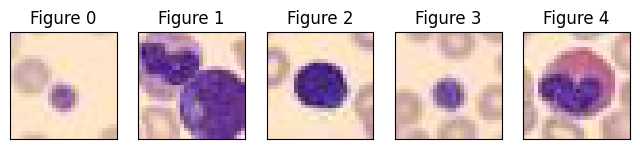

[7 3 4 7 1]


In [6]:
plot_images(X_train_full)
print(y_train_full[0:5])

In order to better display the hyperparameter tuning comparison, we will make a function called `hyperparameter_comparison` to display the mean scores and mean fit times on multiple parameters tuned.

In [7]:
def hyperparameter_comparison(grid_search_cv):
  """
  method to display the results for various parameters used in grid_search_cv. Since the parameters are long, we use the help of plotly to make the graph, displaying the X label when you hover on the bar. In addition, the parameter with highest score will be highlighted.

  parameters
  ----------
  grid_search_cv
    the grid_search trained on the dataset, containing all the hyperparameters used in the tuning.

  """
  hyperparameters = grid_search_cv.cv_results_['params']
  mean_scores = grid_search_cv.cv_results_['mean_test_score']
  mean_fit_times = grid_search_cv.cv_results_['mean_fit_time']
  param = [str(param) for param in hyperparameters]

  max_time = round(np.max(mean_fit_times),-1) + 10


  data = {'parameter': param,
          'num': [i+1 for i in range(len(param))],
          'mean_scores': mean_scores,
          'mean_fit_times': mean_fit_times}

  df = pd.DataFrame(data)

  fig = go.Figure(
    data=go.Bar(x=df['num'],
                y=df['mean_scores'],
                name="Average Scores",
                customdata=np.stack((df['parameter'], df['mean_fit_times']), axis=-1),
                hovertemplate='<b>Parameter</b>: %{customdata[0]}<br>' +
                          '<b>Average Score</b>: %{y:,.4f}<br>' +
                          '<b>Average Fit Time</b>: %{customdata[1]:,.4f}<br>'
                          '<extra></extra>'
                          )
    )

  fig.add_trace(
    go.Scatter(x=df['num'],
               y=df['mean_fit_times'],
               yaxis="y2",
               name="Average Fit Times",
               customdata=np.stack((df['parameter'], df['mean_scores']), axis=-1),
               hovertemplate='<b>Parameter</b>: %{customdata[0]}<br>' +
                          '<b>Average Score</b>: %{customdata[1]:,.4f}<br>' +
                          '<b>Average Fit Time</b>: %{y:,.4f}<br>'
                          '<extra></extra>',
               line=dict(color='#3366CC')
                          )
    )

  fig.update_layout(
    legend=dict(orientation="h"),
    yaxis=dict(
        title=dict(text="Average Score"),
        side="left",
        range=[0, 1],
    ),
    yaxis2=dict(
        title=dict(text="Average Fit Time (second)"),
        side="right",
        range=[0, max_time],
        overlaying="y",
        tickmode="sync",
    ),
  )

  fig.update_layout(hoverlabel=dict(bgcolor="white",
                                    font_size=11,
                                    font_family="Arial"),
                    title_text='Average Score and Fit Time for Various Parameters')


  # Find the index of the highest mean score and highlight the bar
  max_mean_score_index = np.argmax(mean_scores)
  colors = ['#bab0ac'] * len(df)
  colors[max_mean_score_index] = '#e15759'

  fig.update_traces(marker=dict(color=colors))
  fig.show()

Finally, we will utilise the following methods to print our findings:

In [29]:
def print_results(model,X_test,y_test,neural=True):
    '''
    method to print the model's accuracy and f1 score against X_test.

    parameters
    ----------
    model: object
      a trained machine learning object.
    X_test: array
      array that contains the testing subset of X.
    X_test: array
      array that contains the testing subset of y.
    neural: boolean
      if True, apply tensorflow methods. if False, apply sklearn metrics instead.
      
    '''
    if neural == True:
        loss, accuracy = model.evaluate(X_test, y_test,verbose=0)
        print(f"Accuracy on test data: {accuracy:.4f}")
        print(f"Loss value on test data: {loss:.4f}")
        y_proba = model.predict(X_test,verbose=0)
        y_pred = np.argmax(y_proba, axis=-1)
    else:
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test,y_pred)
        print(f"Accuracy on test data: {accuracy:.4f}")
        
    f1score = f1_score(y_test, y_pred, average='macro')
    print(f"F1 Score: {f1score:4f}")

def print_prediction(model,X_test,y_test,neural=True):
    '''
    method to print the model's predicted labels against true labels.
    also plots images of the predicted X data.

    parameters
    ----------
    model: object
      a trained machine learning object.
    X_test: array
      array that contains the testing subset of X.
    X_test: array
      array that contains the testing subset of y.
    neural: boolean
      if True, apply tensorflow methods. if False, apply sklearn metrics instead.
      additionally, if False, reshape X_test in the plot_images method.
      
    '''
    X_test_sample = X_test[3:6]
    
    if neural==True:
        y_proba = model.predict(X_test_sample)
        y_pred = np.argmax(y_proba, axis=-1)
    else:
        y_pred = model.predict(X_test_sample)
    
    print("Predicted labels: ", y_pred)
    print("True labels: ", y_test[3:6])
    
    if neural==True:
        plot_images(X_test_sample, 1, 3)
    else:
        plot_images(X_test_sample.reshape(X_test_sample.shape[0],28,28,3), 1, 3)

## Data exploration

First, let's examine the shape of the given data.


In [9]:
print("Shape of X_train:", X_train_full.shape)
print("Shape of y_train:", y_train_full.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (13673, 28, 28, 3)
Shape of y_train: (13673,)
Shape of X_test: (3419, 28, 28, 3)
Shape of y_test: (3419,)


As we can see, our data consists of 13683 training data with the size of 28x28 px with 3 channels, and 3419 testing data with the size of 28x28 px with 3 channels.

## Preprocessing

In [10]:
X_train_full.dtype

dtype('uint8')

Our data type informs us that each pixel intensity is represented as a byte, in other words our data consists of matrix with 0 to 255 values. To avoid large inputs, we are going to normalise our data to a 0-1 range. In addition, we are going to do data augmentation using the help of albumentations library.

For two of our algorithm (random forest and SVM), we are going to reshape / flatten the data.

In [11]:
# define our image augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.25),
    A.RandomBrightnessContrast(p=0.25),
    A.RandomShadow(p=0.25),
    A.HueSaturationValue(p=0.25),
    A.Rotate(p=0.25)
])

def preprocess(X,normalize=False,augment=False,reshape=False,channel=3,img_w=28,img_h=28):
    '''
    method to preprocess our data.
    it performs normalization, augmentation, and reshaping.
    each action is optional.

    parameters
    ----------
    X: array
      the data we wish to preprocess. expects 4d array.
    normalize: boolean
      if True, perform normalization on X.
    augment: boolean
      if True, perform normalization on X.
    reshape: boolean
      if True, reshape X to a 2d array.
    channel: int
      number of colour channels in X. used in reshape function only.
    img_w: int
      reshaped image width.
    img_h: int
      reshaped image height.

    Returns
    -------
    Preprocessed X

    '''
    #augment our dataset to simulate noise
    #note that the albumentations library only
    #accepts uint8 datatype!
    if augment == True:
        X = X.astype(np.uint8)
        for i in range(len(X)):
            augmented_image = transform(image=X[i])
            X[i] = augmented_image['image']

    #normalize the values of X to be between 0 to 1
    if normalize == True:
      X = X / 255

    #reshape the dataset into 2D array for random forest and SVC
    if reshape == True:
      X = X.reshape(X.shape[0],channel*img_w*img_h)

    return X

For our MLP and CNN algorithms, we are going to normalize and do image augmentation to the dataset.

In [12]:
random.seed(42) # to ensure we get consistent dataset from albumentation
X_train_augmented = preprocess(X_train_full, normalize=True, augment=True, reshape=False)
X_test_augmented = preprocess(X_test, normalize=True, augment=True, reshape=False)

Since random forest and SVM algorithms only accept a flattened dataset, we will do an addition image reshaping to the dataset we previously augmented to maintain the same randomness.

In [13]:
random.seed(42) # to ensure we get consistent dataset from albumentation
X_train_preprocessed = preprocess(X_train_augmented, normalize=False, augment=False, reshape=True)
X_test_preprocessed = preprocess(X_test_augmented, normalize=False, augment=False, reshape=True)

## Examples of preprocessed data

Using the function we defined previously, our data will be as displayed below.

Shape of X_train_augmented: (13673, 28, 28, 3)
Shape of X_test_augmented: (3419, 28, 28, 3)


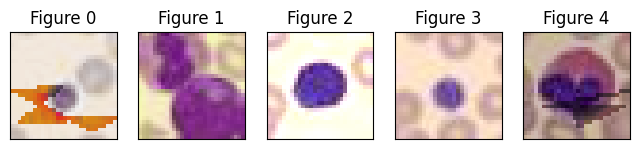

dtype('float64')

In [14]:
print("Shape of X_train_augmented:", X_train_augmented.shape)
print("Shape of X_test_augmented:", X_test_augmented.shape)

plot_images(X_train_augmented, row=1, col=5)
X_train_augmented.dtype

Shape of X_train_preprocessed: (13673, 2352)
Shape of X_test_preprocessed: (3419, 2352)


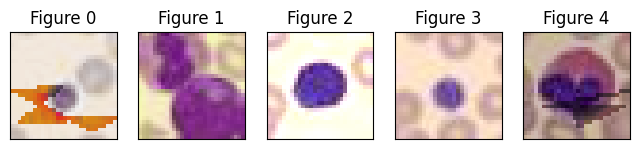

dtype('float64')

In [15]:
print("Shape of X_train_preprocessed:", X_train_preprocessed.shape)
print("Shape of X_test_preprocessed:", X_test_preprocessed.shape)

plot_images(X_train_preprocessed.reshape(X_train_preprocessed.shape[0],28,28,3), row=1, col=5)
X_train_preprocessed.dtype

We are going to split the training data further into training data and validation data. 10% of the full training data is going to be the validation data, and the remaining is the training data. To further enhance the model, we will stratify our data.

In [16]:
def split_train_data(X, y):
    '''
    method to split our training data into training and validation sets.

    parameters
    ----------
    X: array
      training set of X
    Y: array
      training set of Y

    Returns
    -------
    Four arrays that consist of training and validation set of X and Y.
    '''
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, stratify = y, train_size=0.9, random_state = 0)
    return X_train, X_valid, y_train, y_valid

When doing neural networks, we need to determine the appropriate point to stop training in order to minimize overfitting. Therefore, we are going to use the Keras Early Stopping function to automatically stop the model fitting when the score doesn't increase significantly, with the patience of 5 epochs.

In [17]:
#to make sure the session is clear
keras.backend.clear_session()
tf.random.set_seed(42)

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Algorithm design and setup

## Model 1 - Fully Connected Neural Network

In [18]:
def mlp_alg(input_shape = X_train_full.shape[1:], class_number = len(np.unique(y_train_full)), n_hidden_layers = 2, n_hidden_neurons = 50, activation_function = "relu"):
  '''
  method to build a MLP algorithm. If the parameters are not inputted, the default values are used.

  parameters
  ----------
  input_shape: array
    an array of the image size.
  class_number: int
    number of class classification.
  n_hidden_layers: int
    number of layers parameter.
  n_hidden_neurons: int
    number of hidden neurons in each layers.
  activation_function: str
    layers activation parameter.

  returns
  -------
  MLP algorithm model

  '''
  model = keras.models.Sequential()

  #Flatten the model according to the image size (make the image 1D)
  model.add(keras.layers.Flatten(input_shape = input_shape))

  #Add layers according to the input
  for layer in range(n_hidden_layers):
    model.add(keras.layers.Dense(n_hidden_neurons, activation = activation_function))

  #the output layer is based on the unique value of Y
  model.add(keras.layers.Dense(class_number, activation = 'softmax'))

  return model

We will be using KerasClassifier to help us do hyperparameter tuning in the next section.

In [19]:
mlp_classifier = KerasClassifier(mlp_alg,
                                   n_hidden_layers=2,
                                   n_hidden_neurons=50,
                                   activation_function="relu",
                                   loss="sparse_categorical_crossentropy",
                                   optimizer="sgd",
                                   optimizer__learning_rate=0.01,
                                   metrics=["accuracy"]
                                  )

## Model 2 - Convolutional Neural Network

In [20]:
def cnn_alg(input_shape = X_train_full.shape[1:], class_number = len(np.unique(y_train_full)), activation_function = "relu", num_filters = 32, num_layers = 2):
  '''
  method to build a CNN algorithm. If the parameters are not inputted, the default values are used.

  parameters
  ----------
  input_shape: array
    an array of the image size.
  class_number: int
    number of class classification
  activation_function: str
    layers activation parameter.
  num_filters: int
    number of filters for each layer.
  num_layers: int
    number of layers.

  Returns
  -------
  CNN algorithm model

  '''
  model = keras.models.Sequential()

  #specifying the input shape
  model.add(keras.Input(shape = tuple(input_shape)))

  #Add layers according to the number of layers
  for layer in range(num_layers):
    model.add(keras.layers.Conv2D(num_filters, kernel_size=(3, 3), activation=activation_function))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))


  model.add(keras.layers.Flatten())
  model.add(keras.layers.Dropout(0.5))

  #the output layer is based on the unique value of Y
  model.add(keras.layers.Dense(class_number, activation = 'softmax'))

  return model

We will be using KerasClassifier to help us do hyperparameter tuning in the next section.

In [21]:
cnn_classifier = KerasClassifier(cnn_alg,
                                   activation_function="relu",
                                   loss="sparse_categorical_crossentropy",
                                   optimizer="adam",
                                   optimizer__learning_rate=0.01,
                                   num_filters=32,
                                   num_layers=2,
                                   metrics=["accuracy"]
                                  )


## Model 3 - Ensemble Method

In [23]:
def rnd_alg(X,y,**params):
    '''
    method to return a trained random forest model.

    parameters
    ----------
    X: array
        2d array of the input data
    y: array
        1d array of the label data
    **params: keyword argument
        dictionary of any relevant parameters for the random forest classifier

    Returns
    -------
    random forest classifier model
    '''
    rnd = RandomForestClassifier(**params,random_state=24).fit(X,y)
    return rnd

def rnd_alg_unfit():
    '''
    method to return a blank random forest classifier model.

    Returns
    -------
    untrained random forest classifier model
    '''
    rnd = RandomForestClassifier(random_state=24)
    return rnd

rnd = rnd_alg_unfit()

## Model 4 - Support Vector Machine (SVM)

In [24]:
svc_max_iter = 250

def svc_alg(X,y,**params):
    '''
    method to return a trained SVC  model.

    parameters
    ----------
    X: array
        2d array of the input data
    y: array
        1d array of the label data
    **params: keyword argument
        dictionary of any relevant parameters for the SVC

    Returns
    -------
    SVC model
    '''
    svc = SVC(**params,max_iter=svc_max_iter,random_state=24).fit(X,y)
    return svc

def svc_alg_unfit():
    '''
    method to return a blank SVC model with global svc_max_iter.

    Returns
    -------
    untrained SVC model
    '''
    svc = SVC(max_iter=svc_max_iter,random_state=24)
    return svc

svc = svc_alg_unfit()

# Hyperparameter tuning

In this section, we are going to do hyperparameter tuning with the help of grid search CV from sklearn library to all the algorithm models we defined in previous section.

## Model 1 - Fully Connected Neural Network

For our MLP algorithm, we will iterate through three parameters, `n_hidden_neurons`, `optimizer__learning_rate`, and `activation_function`. Taking computation time into account, we will only use three values for each parameters and 20 epochs. For this model, we will be using the `X_train_augmented` dataset.

In [25]:
X_train_nn, X_valid_nn, y_train_nn, y_valid_nn = split_train_data(X_train_augmented, y_train_full)

In [ ]:
param_grid = {
  "n_hidden_neurons": [100, 200, 300],
  "optimizer__learning_rate": [0.0001, 0.001, 0.1],
  "activation_function": ["relu", "sigmoid", "tanh"]
}

grid_search_cv_mlp = GridSearchCV(mlp_classifier, param_grid, cv=3, verbose=2)
grid_search_result_mlp = grid_search_cv_mlp.fit(X_train_nn, y_train_nn, epochs=20)

In [85]:
best_parameters_mlp = grid_search_result_mlp.best_params_
print(best_parameters_mlp)

{'activation_function': 'tanh', 'n_hidden_neurons': 300, 'optimizer__learning_rate': 0.1}


As we can see, the parameter that give out the best score is as follows:


1.   activation_function = tanh
2.   n_hidden_neurons = 300
3.   optimizer__learning_rate = 0.1

To better see the result, we will plot the various parameters we tested in a bar chart.


*notes: Hover the bar to see the parameters used*

In [86]:
hyperparameter_comparison(grid_search_cv_mlp)

## Model 2 - Convolutional Neural Network

Similar to our MLP model, we will use three parameters with three values each to iterate through our model and find the one with the best mean score. The parameters we will iterate are `num_filters`, `num_layers`, and `batch_size` on the same dataset we use in MLP.

In [ ]:
param_grid = {
    'num_filters': [16, 32, 64],
    'num_layers': [1, 2, 3],
    'batch_size': [32, 64, 128]
}

grid_search_cv_cnn = GridSearchCV(cnn_classifier, param_grid, cv=3, verbose=2)
grid_search_result_cnn = grid_search_cv_cnn.fit(X_train_nn, y_train_nn, epochs=20)

In [102]:
best_parameters_cnn = grid_search_result_cnn.best_params_
print(best_parameters_cnn)

{'batch_size': 128, 'num_filters': 16, 'num_layers': 2}


As we can see, the parameter that give out the best score is as follows:


1.   batch_size = 128
2.   num_filters = 16
3.   num_layers = 2

To better see the result, we will plot the various parameters we tested in a bar chart.


*notes: Hover the bar to see the parameters used*

In [103]:
hyperparameter_comparison(grid_search_cv_cnn)

## Model 3 - Random Forest



For our random forest ensemble, we will be iterating through the following parameters:


1.   `n_estimators`: number of decision trees in the ensemble
2.   `max_depth`: maximum number of dividing tests allowed per decision tree
3.   `criterion`: loss criterion to determine how the data is split in each leaf node



In [27]:
X_train_rnd, X_valid_rnd, y_train_rnd, y_valid_rnd = split_train_data(X_train_preprocessed, y_train_full)

In [ ]:
param_grid = {
  "n_estimators": [75,100,125],
  "max_depth": [25,50,75],
  "criterion": ['gini','entropy','log_loss']
}

rnd = rnd_alg_unfit() # call blank randomforest ensemble

#perform hyperparameter tuning
grid_search_rnd = GridSearchCV(rnd, param_grid, return_train_score=True, cv=3, verbose=2)

#save result to display and plot in next cells
grid_search_rnd_result = grid_search_rnd.fit(X_train_rnd, y_train_rnd)

In [29]:
best_parameters_rnd = grid_search_rnd_result.best_params_
print(best_parameters_rnd)
print(grid_search_rnd.best_score_)

{'criterion': 'gini', 'max_depth': 25, 'n_estimators': 125}
0.7518080066172473


As we can see, the parameter that give out the best score is as follows:


1.   `n_estimators`: 125
2.   `max_depth`: 25
3.   `criterion`: gini

To better see the result, we will plot the various parameters we tested in a bar chart.


*notes: Hover the bar to see the parameters used*

In [30]:
hyperparameter_comparison(grid_search_rnd)

## Model 4 - SVC

Lastly, for our support vector classifier, we will be iterating through the following parameters:


1.   `kernel`: the kernel function to be used in the SVC
2.   `C`: the regularizer to determine how harsh the decision boundary will be in detecting misclassification
3.   `gamma`: determines the smoothness of the decision boundary for non-linear kernel function

In [31]:
X_train_svc, X_valid_svc, y_train_svc, y_valid_svc = split_train_data(X_train_preprocessed, y_train_full)

In [ ]:
param_grid = [
  {'C': [5, 15, 50], 'kernel': ['linear']},
  {'C': [5, 15, 50], 'gamma': ['scale','auto',0.005], 'kernel': ['rbf','poly']},
]
svc = svc_alg_unfit() # call blank svc

grid_search_svc = GridSearchCV(svc, param_grid, return_train_score=True, cv=3, verbose=2)
grid_search_svc_result = grid_search_svc.fit(X_train_svc, y_train_svc)

In [37]:
best_parameters_svc = grid_search_svc_result.best_params_
print(best_parameters_svc)
print(grid_search_svc.best_score_)

{'C': 5, 'gamma': 'scale', 'kernel': 'rbf'}
0.7366922790947399


As we can see, the parameter that give out the best score is as follows:


1.   `kernel`: rbf
2.   `C`: 5
3.   `gamma`: scale

To better see the result, we will plot the various parameters we tested in a bar chart.


*notes: Hover the bar to see the parameters used*

In [34]:
hyperparameter_comparison(grid_search_svc)

# Final Models

In this section, we will finalize the model using best parameters we attained previously.

## Model 1 - Fully Connected Neural Network

In [26]:
mlp_model = mlp_alg(input_shape = [28,28,3],
                    n_hidden_neurons = 300,
                    activation_function = "tanh")

mlp_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 2352)              0         
                                                                 
 dense_6 (Dense)             (None, 300)               705900    
                                                                 
 dense_7 (Dense)             (None, 300)               90300     
                                                                 
 dense_8 (Dense)             (None, 8)                 2408      
                                                                 
Total params: 798,608
Trainable params: 798,608
Non-trainable params: 0
_________________________________________________________________


For our MLP model, we are going to fit our training data using 100 as the maximum number of epochs. With the help of Keras library, we will use early stopping function to avoid overfitting, using the validation data accuracy loss as the stopping point.

In [27]:
mlp_model.compile(optimizer = keras.optimizers.SGD(learning_rate=0.1), loss = "sparse_categorical_crossentropy", metrics = ['accuracy'])

start_time = time.time()
history = mlp_model.fit(X_train_nn, y_train_nn,
                        epochs = 100,
                        validation_data = (X_valid_nn, y_valid_nn),
                        callbacks = [early_stopping])
end_time = time.time()

Epoch 1/100
385/385 [==============================] - 9s 20ms/step - loss: 2.4376 - accuracy: 0.2459 - val_loss: 1.6966 - val_accuracy: 0.3187
Epoch 2/100
385/385 [==============================] - 3s 7ms/step - loss: 1.4423 - accuracy: 0.4281 - val_loss: 2.5634 - val_accuracy: 0.1637
Epoch 3/100
385/385 [==============================] - 2s 6ms/step - loss: 1.3017 - accuracy: 0.4929 - val_loss: 1.2104 - val_accuracy: 0.5154
Epoch 4/100
385/385 [==============================] - 2s 6ms/step - loss: 1.2022 - accuracy: 0.5402 - val_loss: 1.1741 - val_accuracy: 0.5344
Epoch 5/100
385/385 [==============================] - 2s 6ms/step - loss: 1.1291 - accuracy: 0.5667 - val_loss: 0.9858 - val_accuracy: 0.6170
Epoch 6/100
385/385 [==============================] - 2s 6ms/step - loss: 1.0754 - accuracy: 0.5896 - val_loss: 1.0442 - val_accuracy: 0.5928
Epoch 7/100
385/385 [==============================] - 2s 6ms/step - loss: 1.0341 - accuracy: 0.6102 - val_loss: 1.0252 - val_accuracy: 0.604

After that, we will check our model when we apply it on our testing data.

In [30]:
print_results(mlp_model, X_test_augmented, y_test, neural=True)
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Accuracy on test data: 0.6110
Loss value on test data: 0.9960
F1 Score: 0.568800
Training time: 29.8802 seconds


The example of our model prediction is as follows.

1/1 [==============================] - 0s 31ms/step


Predicted labels:  [6 1 5]
True labels:  [6 1 5]


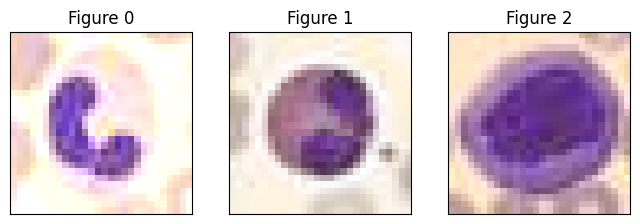

In [31]:
print_prediction(mlp_model, X_test_augmented, y_test, neural=True)

## Model 2 - Convolutional Neural Network

In [32]:
cnn_model = cnn_alg(num_filters = 16,
                    num_layers = 2)

cnn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 16)        2320      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 400)               0         
                                                                 
 dropout (Dropout)           (None, 400)              

Similar to our MLP, we will use Keras early stopping in order to avoid overfitting, with 100 as the maximum number of epochs.

In [ ]:
cnn_model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ['accuracy'])

start_time = time.time()
history = cnn_model.fit(X_train_nn, y_train_nn,
                        batch_size = 128,
                        epochs = 100, validation_data = (X_valid_nn, y_valid_nn),
                        callbacks = [early_stopping])
end_time = time.time()

The loss and accuracy of our model when applied on our testing data is as follows.

In [34]:
print_results(cnn_model, X_test_augmented, y_test, neural=True)
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Accuracy on test data: 0.7961
Loss value on test data: 0.5901
F1 Score: 0.741814
Training time: 148.8725 seconds


The example of label prediction using our CNN model is as follows.

1/1 [==============================] - 0s 38ms/step


Predicted labels:  [6 1 3]
True labels:  [6 1 5]


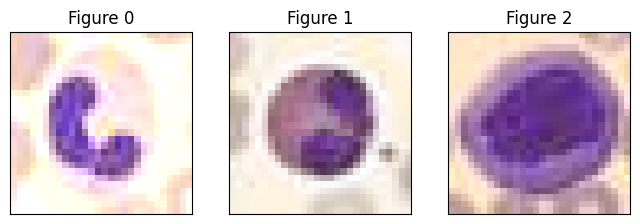

In [35]:
print_prediction(cnn_model, X_test_augmented, y_test, neural=True)

## Model 3 - Random Forest Ensemble

We will introduce a Stratified K Fold method to aid us in seeing our cross-validation score for the random forest ensemble and SVC model.

In [61]:
cvKFold = StratifiedKFold(n_splits=10, random_state=24, shuffle=True)

In [59]:
params = {'criterion': 'gini', 'max_depth': 25, 'n_estimators': 125}

start_time = time.time()
rnd_model = rnd_alg(X_train_rnd,y_train_rnd,**params)
end_time = time.time()

The model above produces the following results:

In [66]:
print_results(rnd_model, X_test_preprocessed, y_test, neural=False)
cross_val = cross_val_score(rnd_model, X_valid_rnd, y_valid_rnd, cv=cvKFold).mean()
print(f"Cross-validation score: {cross_val:.4f}")
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Accuracy on test data: 0.7596
F1 Score: 0.708633
Cross-validation score: 0.6959
Fit time:  58.70959830284119
Accuracy on test data: 0.7596


We can then see our model's prediction against the following samples:

Predicted labels:  [6 1 3]
True labels:  [6 1 5]


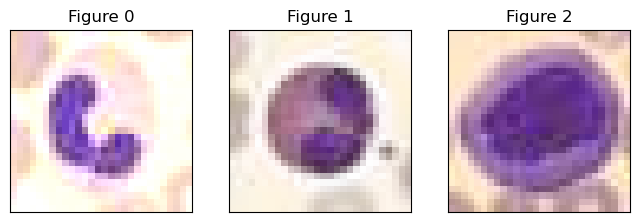

In [76]:
print_prediction(rnd_model, X_test_preprocessed, y_test, neural=False)

## Model 4 - SVC

In [ ]:
params = {'C': 5, 'gamma': 'scale', 'kernel': 'rbf'}

start_time = time.time()
svc_model = svc_alg(X_train_svc,y_train_svc,**params)
end_time = time.time()

The model above produces the following results:

In [68]:
print_results(svc_model, X_test_preprocessed, y_test, neural=False)
cross_val = cross_val_score(rnd_model, X_valid_rnd, y_valid_rnd, cv=cvKFold).mean()
print(f"Cross-validation score: {cross_val:.4f}")
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Accuracy on test data: 0.7175
F1 Score: 0.695666
Cross-validation score: 0.6959
Training time: 37.7335 seconds


We can then see our model's prediction against the following samples:

Predicted labels:  [6 1 5]
True labels:  [6 1 5]


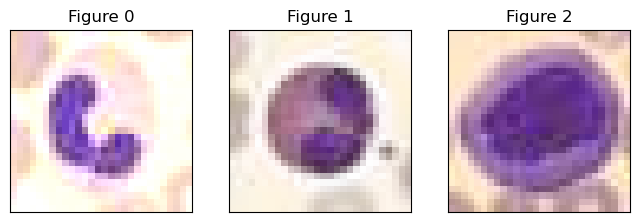

In [75]:
print_prediction(svc_model, X_test_preprocessed, y_test, neural=False)

# Appendix

Simpler experiment (5 epochs) on neural network algorithms without image augmentation.

MLP model.

In [ ]:
X_train_all_a = X_train_full / 255
X_test_a = X_test / 255

X_train_a, X_valid_a, y_train_a, y_valid_a = split_train_data(X_train_all_a, y_train_full)

param_grid = {
  "n_hidden_neurons": [100, 200, 300],
  "optimizer__learning_rate": [0.0001, 0.001, 0.1],
  "activation_function": ["relu", "sigmoid", "tanh"]
}

grid_search_cv_mlp = GridSearchCV(mlp_classifier, param_grid, cv=3, verbose=2)
grid_search_result_mlp = grid_search_cv_mlp.fit(X_train_a, y_train_a, epochs=5)

In [37]:
best_parameters_mlp = grid_search_result_mlp.best_params_
print(best_parameters_mlp)
hyperparameter_comparison(grid_search_cv_mlp)

{'activation_function': 'tanh', 'n_hidden_neurons': 300, 'optimizer__learning_rate': 0.001}


In [ ]:
mlp_model = mlp_alg(input_shape = X_train_a.shape[1:],
                    n_hidden_neurons = best_parameters_mlp.get("n_hidden_neurons"),
                    activation_function = best_parameters_mlp.get("activation_function"))

mlp_model.compile(optimizer = keras.optimizers.SGD(learning_rate=best_parameters_mlp.get("optimizer__learning_rate")), loss = "sparse_categorical_crossentropy", metrics = ['accuracy'])

start_time = time.time()
history = mlp_model.fit(X_train_a, y_train_a,
                        epochs = 100,
                        validation_data = (X_valid_a, y_valid_a),
                        callbacks = [early_stopping])
end_time = time.time()

In [45]:
print_results(mlp_model, X_test_a, y_test, neural=True)
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Accuracy on test data: 0.7956
Loss value on test data: 0.5297
F1 Score: 0.752582
Training time: 163.8636 seconds


CNN model.

In [ ]:
param_grid = {
    'num_filters': [16, 32, 64],
    'num_layers': [1, 2, 3],
    'batch_size': [32, 64, 128]
}

grid_search_cv_cnn = GridSearchCV(cnn_classifier, param_grid, cv=3, verbose=2)
grid_search_result_cnn = grid_search_cv_cnn.fit(X_train_a, y_train_a, epochs=5)

In [41]:
best_parameters_cnn = grid_search_result_cnn.best_params_
print(best_parameters_cnn)
hyperparameter_comparison(grid_search_cv_cnn)

{'batch_size': 32, 'num_filters': 32, 'num_layers': 2}


In [ ]:
cnn_model = cnn_alg(num_filters = best_parameters_cnn.get("num_filters"),
                    num_layers = best_parameters_cnn.get("num_layers"))

cnn_model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ['accuracy'])

start_time = time.time()
history = cnn_model.fit(X_train_a, y_train_a,
                        batch_size = best_parameters_cnn.get("batch_size"),
                        epochs = 100, validation_data = (X_valid_a, y_valid_a),
                        callbacks = [early_stopping])
end_time = time.time()

In [46]:
print_results(cnn_model, X_test_a, y_test, neural=True)
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Accuracy on test data: 0.8821
Loss value on test data: 0.3659
F1 Score: 0.858672
Training time: 163.8636 seconds


Extracting the first decision tree from the random forest ensemble: (graphviz required)

In [86]:
tree = rnd_model.estimators_[0]

export_graphviz(tree, out_file="tree.dot", impurity=False, filled=True)

with open("tree.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))